In [238]:

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set()
sns.set(rc={'figure.figsize':(11.7,8.27)})

pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None) #50 for truncated view, -1 for full view

In [2]:
SWaT_Dataset_Normal_v0 = pd.read_pickle('dataset/SWaT_Dataset_Normal_v0.pkl')
SWaT_Dataset_Normal_v1 = pd.read_pickle('dataset/SWaT_Dataset_Normal_v1.pkl')
SWaT_Dataset_Attack_v0 = pd.read_pickle('dataset/SWaT_Dataset_Attack_v0.pkl')

## Check difference between SWaT_Dataset_Normal_v0 and SWaT_Dataset_Normal_v1

In [73]:
print(len(SWaT_Dataset_Normal_v0))
print(len(SWaT_Dataset_Normal_v1))
print(len(SWaT_Dataset_Attack_v0))

496800
495000
449919


In [63]:
d1 = SWaT_Dataset_Normal_v0.iloc[1800:]
d2 = SWaT_Dataset_Normal_v1.iloc[:]

In [64]:
d1 = d1.reset_index(drop=True)
d2 = d2.reset_index(drop=True)

In [65]:
d3 = pd.concat([d1['P1']['FIT101'], d2['P1']['FIT101']], axis=1)

In [66]:
d3['difference'] = d3.apply(lambda x: x[0] - x[1], axis=1)

In [69]:
d3['difference'].sum()

0.0

## Clean dataset

In [3]:
SWaT_Dataset_Attack_v0.columns = SWaT_Dataset_Normal_v0.columns

In [50]:
df = SWaT_Dataset_Normal_v0.append(SWaT_Dataset_Attack_v0)
df = df.reset_index(drop=True)

In [ ]:
# palette = sns.color_palette("rocket_r")

# # Plot the lines on two facets
# sns.relplot(
#     data=df,
#     x="index", 
#     y="Normal/Attack",
#     hue="AIT402", kind="line", size_order=["T1", "T2"], 
#     height=5, aspect=.75, facet_kws=dict(sharex=False),
# )

In [30]:
sns.violinplot(data=df, x="index", y="AIT402", hue="Normal/Attack",
               split=True, inner="quart", linewidth=1,
               palette={"Yes": "b", "No": ".85"})
sns.despine(left=True)

Create clean dataset

In [51]:
df = pd.concat([df['Unnamed: 0_level_0'], df['P1'], df['P2'], df['P3'], df['P4'], df['P5'], df['P6']], axis=1)

Add index column

In [52]:
df['index'] = [i for i in range(len(df))]

Clean Timestamp column

In [53]:
df.rename(columns={' Timestamp':'Timestamp'}, inplace=True)

In [ ]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

Clean Normal/Attack column

In [54]:
df['Normal/Attack'].value_counts()

Normal     892098
Attack      54584
A ttack        37
Name: Normal/Attack, dtype: int64

In [55]:
typos = {
    "Attack": ["A ttack"],
}
c = "Normal/Attack"
for expected, founds in typos.items():
    for typo in founds:
        s = df[c] == typo
        df.loc[s, c] = expected

In [56]:
df['Normal/Attack'].value_counts()

Normal    892098
Attack     54621
Name: Normal/Attack, dtype: int64

In [57]:
for col in df.columns:
    if df[col].isna().sum() != 0:
        print(col, df[col].isna().sum())

## Feature Selection

Check feature with a variance equal to zero

In [131]:
df['attack'] = df['Normal/Attack'].apply(lambda x: 1 if x == 'Attack' else 0)

In [132]:
cols_numeric = list(df.columns)
cols_numeric.remove('Timestamp')
cols_numeric.remove('Normal/Attack')
cols_numeric.remove('index')
for col in cols_numeric:
    var = np.var(df[col])
    if var == 0:
        print(col)
        cols_numeric.remove(col)

remove feature with variance of 0

In [59]:
df = df.drop(columns=['P202','P401','P404','P502','P601','P603'])

In [ ]:
# df.to_pickle('dataset/clean_dataset.pkl')

df clean already in dataset, read them

In [169]:
df = pd.read_pickle('dataset/clean_dataset.pkl')

**Normalization of dataset**

mean normalization

In [133]:
data = df[cols_numeric]
mean_normalized_df = (data-data.mean())/data.std()

min-max normalization

In [134]:
data = df[cols_numeric]
min_max_normalized_df = (data-data.min())/(data.max()-data.min())

In [136]:
min_max_normalized_df['attack'].value_counts()

0.0    892098
1.0     54621
Name: attack, dtype: int64

## Load list of attacks information

In [199]:
df.columns

Index(['Timestamp', 'FIT101', 'LIT101', 'MV101', 'P101', 'P102', 'AIT201',
       'AIT202', 'AIT203', 'FIT201', 'MV201', 'P201', 'P203', 'P204', 'P205',
       'P206', 'DPIT301', 'FIT301', 'LIT301', 'MV301', 'MV302', 'MV303',
       'MV304', 'P301', 'P302', 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'P402',
       'P403', 'UV401', 'AIT501', 'AIT502', 'AIT503', 'AIT504', 'FIT501',
       'FIT502', 'FIT503', 'FIT504', 'P501', 'PIT501', 'PIT502', 'PIT503',
       'FIT601', 'P602', 'Normal/Attack', 'index', 'attack'],
      dtype='object')

In [197]:
attacks_df = pd.read_csv('attacks.csv')
attacks_df['Start Time'] = pd.to_datetime(attacks_df['Start Time'])
attacks_df['End Time'] = pd.to_datetime(attacks_df['End Time'])
attacks_df = attacks_df.drop(columns=["Attack Point", "Start State", "Attack", "Actual Change", "Expected Impact or attacker intent", "Unexpected Outcome"])

In [250]:
list_of_attacks = pd.read_csv('list_of_attacks.csv')
list_of_attacks = list_of_attacks.drop(columns=["Start Time", "End Time"])

In [251]:
attacks_list_df = attacks_df.merge(list_of_attacks, on='Attack#', how='left')

In [253]:
attacks_list_df.to_csv('attacks_list_df.csv', index=False)

In [302]:
attacks_list_df = pd.read_csv('attacks_list_df.csv')

In [303]:
attacks_list_df

,Attack#,Start Time,End Time,Attack Type,Attack Point,Start State,Attack,Actual Change,Expected Impact or attacker intent,Unexpected Outcome
0,1,2015-12-28 10:29:14,2015-12-28 10:44:53,Single Stage Single Point Attacks,"MV-101, LIT-101",MV-101 is closed,Open MV-101,Yes,Tank overflow,NaN
1,2,2015-12-28 10:51:08,2015-12-28 10:58:30,Single Stage Single Point Attacks,"P-102, P-101",P-101 is on where as P-102 is off,Turn on P-102,Yes,Pipe bursts,NaN
2,3,2015-12-28 11:22:00,2015-12-28 11:28:22,Single Stage Single Point Attacks,"LIT-101, P-101",Water level between L and H,Increase by 1 mm every second,No,Tank Underflow; Damage P-101,NaN
3,4,2015-12-28 11:47:39,2015-12-28 11:54:08,Single Stage Single Point Attacks,MV-504,MV-504 is closed,Open MV-504,Yes,Halt RO shut down sequence; Reduce life of RO,No impact
4,6,2015-12-28 12:00:55,2015-12-28 12:04:10,Single Stage Single Point Attacks,"AIT-202, P-203, AIT-504",Value of AIT-202 is >7.05,Set value of AIT-202 as 6,No,P-203 turns off; Change in water quality,Impact seen on AIT-504 after two hours at around 14:15. It increased above HH but Drainage did not start
5,7,2015-12-28 12:08:25,2015-12-28 12:15:33,Single Stage Single Point Attacks,"LIT-301, P-301",Water level between L and H,Water level increased above HH,No,Stop of inflow; Tank underflow; Damage P-301,NaN
6,8,2015-12-28 13:10:10,2015-12-28 13:26:13,Single Stage Single Point Attacks,"DPIT-301, LIT-301, LIT-401",Value of DPIT is <40kpa,Set value of DPIT as >40kpa,No,Backwash process is started again and again; Normal operation stops; Decrease in water level of tank 401. Increase in water level of tank 301,NaN
7,10,2015-12-28 14:16:20,2015-12-28 14:19:00,Single Stage Single Point Attacks,FIT-401,Value of FIT-401 above 1,Set value of FIT-401 as <0.7,No,UV shutdown; P-501 turns off;,UV did not shutdown; P-501 did not turn off
8,11,2015-12-28 14:19:00,2015-12-28 14:28:20,Single Stage Single Point Attacks,"FIT-401, P-501",Value of FIT-401 above 1,Set value of FIT-401 as 0,No,UV shutdown; P-501 turns off;,NaN
9,13,2015-12-29 11:11:25,2015-12-29 11:15:17,Single Stage Single Point Attacks,MV-304,MV-304 is open,Close MV-304,Yes,Halt of stage 3 because change in the backwash process,UF Startup did not stop because MV-304 was closed late


In [261]:
start_time = attacks_list_df.iloc[3]['Start Time']
end_time = attacks_list_df.iloc[3]['End Time']

start_time = pd.to_datetime(start_time)
end_time = pd.to_datetime(end_time)

start_time = start_time - pd.Timedelta(minutes=10)
end_time = end_time + pd.Timedelta(minutes=10)
s = df['Timestamp'].between(start_time, end_time)
df.loc[s]

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,MV201,P201,P203,P204,P205,P206,DPIT301,FIT301,LIT301,MV301,MV302,MV303,MV304,P301,P302,AIT401,AIT402,FIT401,LIT401,P402,P403,UV401,AIT501,AIT502,AIT503,AIT504,FIT501,FIT502,FIT503,FIT504,P501,PIT501,PIT502,PIT503,FIT601,P602,Normal/Attack,index,attack
502659,2015-12-28 11:37:39,0.000000,721.8190,1,2,1,263.3620,8.371443,333.7350,2.458463,2,1,2,1,2,1,19.71637,2.210806,789.9818,1,2,1,1,1,2,148.808,153.4222,1.715567,792.9890,2,1,2,7.875417,142.2968,263.5222,12.30454,1.724942,1.272704,0.735397,0.308298,2,249.1509,1.698010,188.1248,0.000128,1,Normal,502659,0
502660,2015-12-28 11:37:40,0.000000,721.1517,1,2,1,263.3620,8.371443,333.7350,2.459616,2,1,2,1,2,1,19.71637,2.212856,789.8616,1,2,1,1,1,2,148.808,153.4222,1.715567,793.0659,2,1,2,7.875417,142.2968,263.5222,12.30454,1.724942,1.271295,0.735397,0.308298,2,249.1509,1.698010,188.1248,0.000128,1,Normal,502660,0
502661,2015-12-28 11:37:41,0.000000,720.6807,1,2,1,263.3620,8.371443,333.7350,2.459616,2,1,2,1,2,1,19.71637,2.214521,789.8616,1,2,1,1,1,2,148.808,153.4222,1.715567,793.4504,2,1,2,7.875417,142.2968,263.5222,12.30454,1.724942,1.271295,0.735397,0.308298,2,248.8785,1.698010,188.0447,0.000128,1,Normal,502661,0
502662,2015-12-28 11:37:42,0.000000,720.1703,1,2,1,263.3620,8.371443,333.7350,2.459616,2,1,2,1,2,1,19.71637,2.214521,790.1019,1,2,1,1,1,2,148.808,153.4222,1.715567,793.4119,2,1,2,7.875417,142.2968,263.5222,12.30454,1.724942,1.271295,0.735397,0.308298,2,248.8785,1.698010,188.0447,0.000128,1,Normal,502662,0
502663,2015-12-28 11:37:43,0.000000,719.6208,1,2,1,263.3620,8.373045,333.7350,2.458976,2,1,2,1,2,1,19.74838,2.214521,790.3422,1,2,1,1,1,2,148.808,153.4222,1.716464,793.9887,2,1,2,7.875417,142.3225,263.5222,12.30454,1.724942,1.262969,0.735397,0.308298,2,248.8785,1.698010,187.8525,0.000128,1,Normal,502663,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504244,2015-12-28 12:04:04,2.548442,511.5812,2,2,1,263.4261,8.365035,329.5309,2.441034,2,1,2,1,2,1,19.64274,2.210806,868.8478,1,2,1,1,1,2,148.808,155.2679,1.725691,919.6104,2,1,2,7.869969,144.7834,261.7598,12.22763,1.734555,1.281670,0.732964,0.306889,2,249.6155,1.665972,188.6055,0.000128,1,Attack,504244,1
504245,2015-12-28 12:04:05,2.548442,511.3849,2,2,1,263.4261,8.365035,329.5309,2.441034,2,1,2,1,2,1,19.64274,2.210806,869.1281,1,2,1,1,1,2,148.808,155.2679,1.725691,919.6488,2,1,2,7.869969,144.7834,261.7598,12.22763,1.734555,1.283079,0.732708,0.306249,2,249.7757,1.826162,188.6055,0.000128,1,Attack,504245,1
504246,2015-12-28 12:04:06,2.551965,511.1887,2,2,1,263.4261,8.365035,329.5309,2.441034,2,1,2,1,2,1,19.72277,2.210806,869.0881,1,2,1,1,1,2,148.808,155.2679,1.727613,919.6104,2,1,2,7.869969,144.7834,261.7598,12.22763,1.734555,1.302933,0.732708,0.306249,2,249.7757,1.826162,188.6055,0.000128,1,Attack,504246,1
504247,2015-12-28 12:04:07,2.554847,510.7961,2,2,1,263.4261,8.365035,329.5309,2.441034,2,1,2,1,2,1,19.73238,2.210166,868.9679,1,2,1,1,1,2,148.808,155.2679,1.727613,919.9949,2,1,2,7.869969,144.7834,261.7598,12.22763,1.734555,1.308185,0.732708,0.306249,2,249.7757,1.826162,188.6055,0.000128,1,Attack,504247,1


In [287]:
for i in range(1, 7):
    print(i, int((i+1) / 3)+1)

1 1
2 2
3 2
4 2
5 3
6 3


['MV-101', 'LIT-101']
1 2
Start State: MV-101 is closed 
Attack: Open MV-101 
Expected Impact: Tank overflow


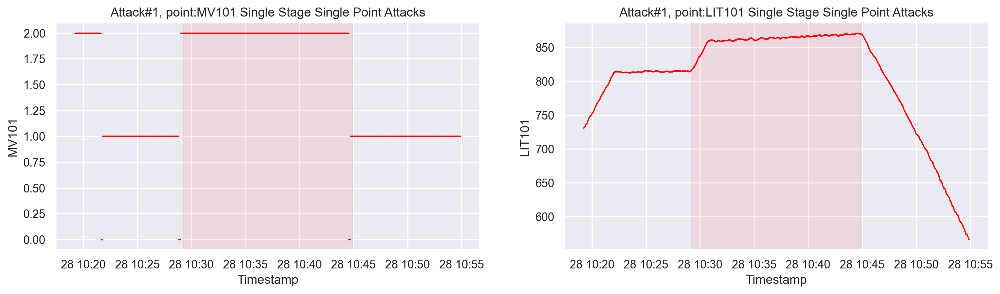

['P-102', 'P-101']
1 2
Start State: P-101 is on where as P-102 is off 
Attack: Turn on P-102 
Expected Impact: Pipe bursts


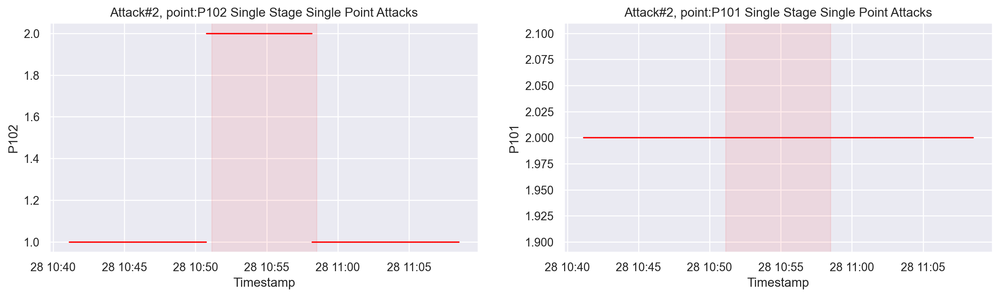

['LIT-101', 'P-101']
1 2
Start State: Water level between L and H 
Attack: Increase by 1 mm every second 
Expected Impact: Tank Underflow; Damage P-101


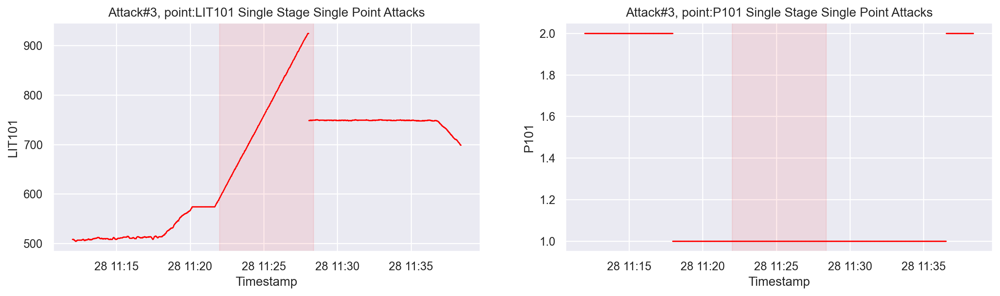

['MV-504']
1 1
Start State: MV-504 is closed 
Attack: Open MV-504 
Expected Impact: Halt RO shut down sequence; Reduce life of RO
Unexpected Outcome: No impact
MV504 not found in dataset


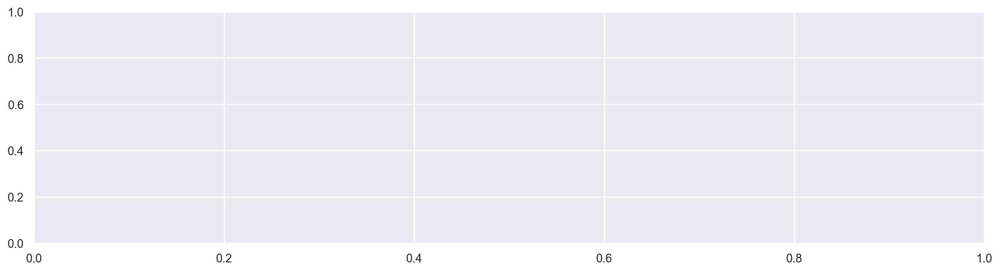

['AIT-202', 'P-203', 'AIT-504']
2 2
Start State: Value of AIT-202 is >7.05 
Attack: Set value of AIT-202  as 6 
Expected Impact: P-203 turns off; Change in water quality
Unexpected Outcome: Impact seen on AIT-504 after two hours at around 14:15. It increased above HH but Drainage did not start


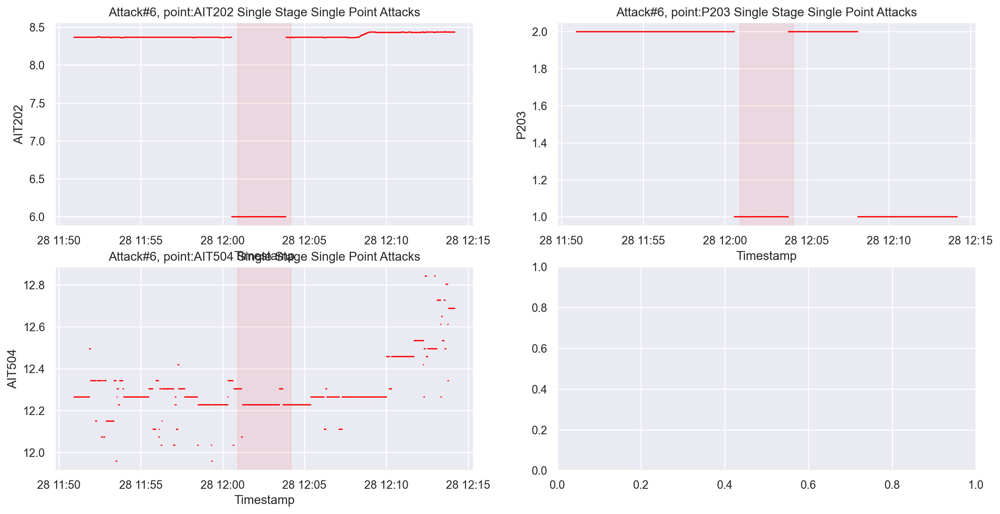

['LIT-301', 'P-301']
1 2
Start State: Water level between L and H 
Attack: Water level increased above HH 
Expected Impact: Stop of inflow; Tank underflow; Damage P-301


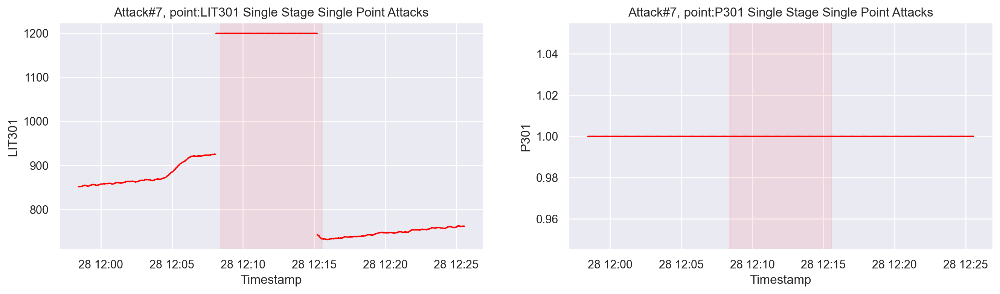

['DPIT-301', 'LIT-301', 'LIT-401']
2 2
Start State: Value of DPIT is <40kpa 
Attack: Set value of DPIT as >40kpa 
Expected Impact: Backwash process is started again and again; Normal operation stops; Decrease in water level of tank 401. Increase in water level of tank 301


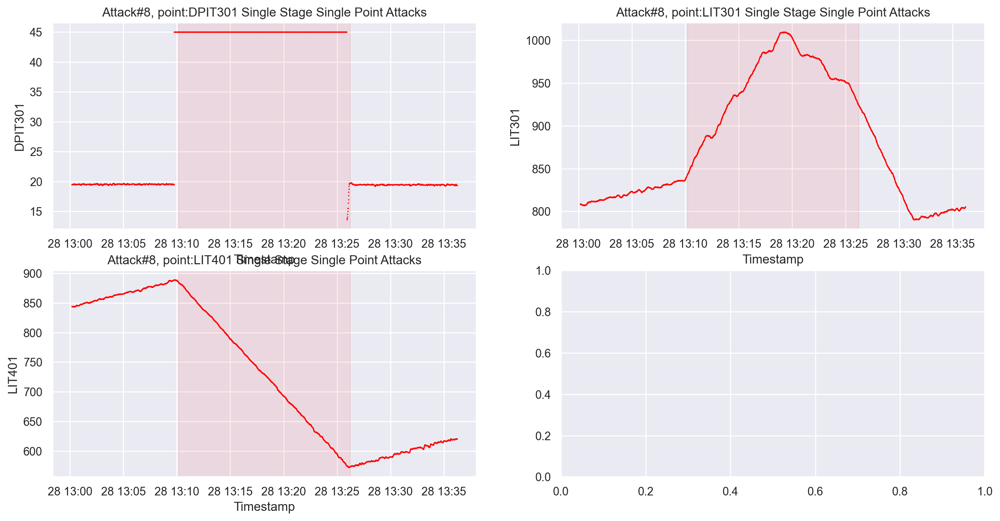

['FIT-401']
1 1
Start State: Value of FIT-401 above 1 
Attack: Set value of FIT-401 as <0.7 
Expected Impact: UV shutdown; P-501 turns off; 
Unexpected Outcome: UV did not shutdown; P-501 did not turn off


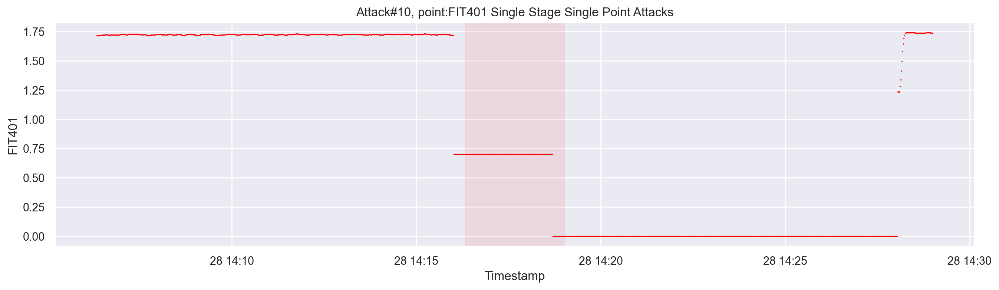

['FIT-401', 'P-501']
1 2
Start State: Value of FIT-401 above 1 
Attack: Set value of FIT-401 as 0 
Expected Impact: UV shutdown; P-501 turns off; 


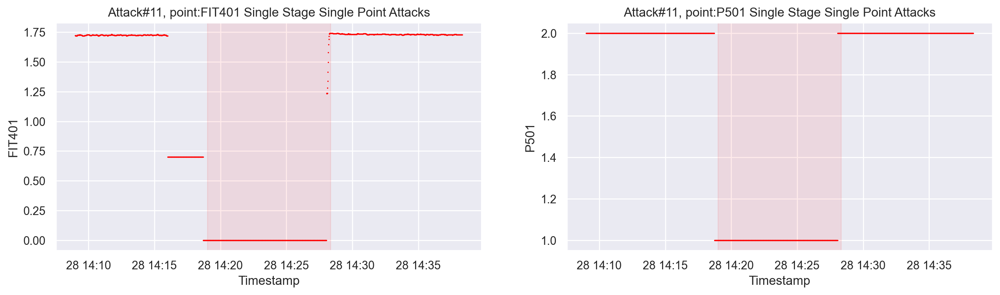

['MV-304']
1 1
Start State: MV-304 is open 
Attack: Close MV-304 
Expected Impact: Halt of stage 3 because change in the backwash process
Unexpected Outcome: UF Startup did not stop because MV-304 was closed late


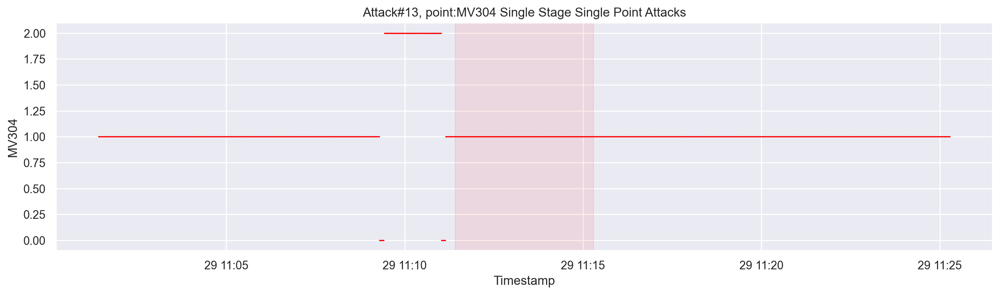

['MV-303', 'LIT-301']
1 2
Start State: MV-303 is closed 
Attack: Do not let MV-303 open 
Expected Impact: Halt of stage 3 because change in the backwash process
Unexpected Outcome: Attack Failed because Startup sequence did not start because Tank 301 was already full


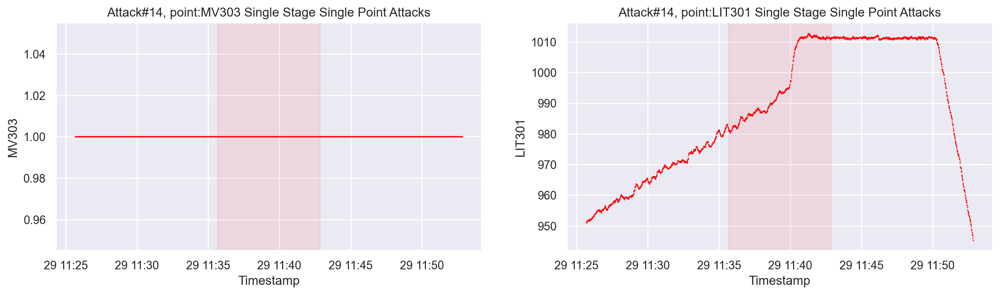

['LIT-301']
1 1
Start State: Water level between L and H 
Attack: Decrease water level by 1mm each second 
Expected Impact: Tank Overflow


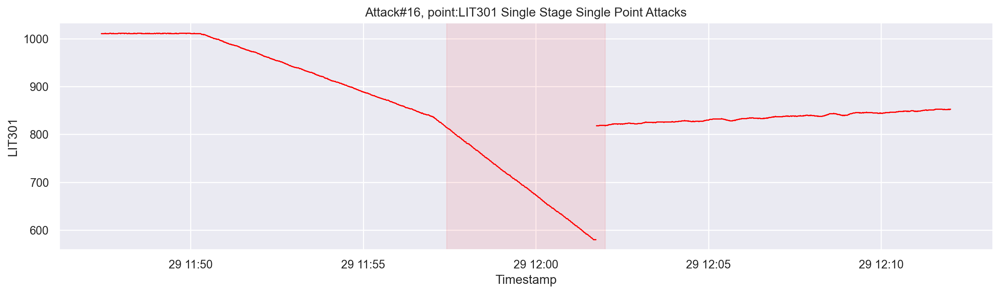

['MV-303']
1 1
Start State: Closed 
Attack: Do not let MV-303 open 
Expected Impact: Halt of stage 3 because change in the backwash process


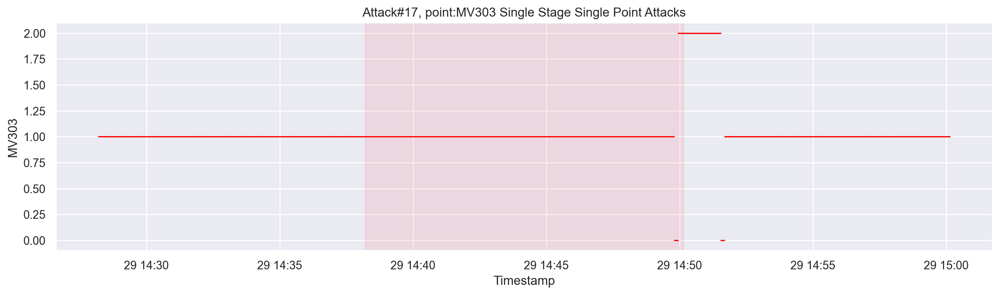

['AIT-504']
1 1
Start State: Value of AIT-504 <15 uS/cm 
Attack: Set value of AIT-504 to 16 uS/cm 
Expected Impact: RO shut down sequence starts after 30 minutes. Water should go to drain.
Unexpected Outcome: RO did not shutdown; Water did not go to drain


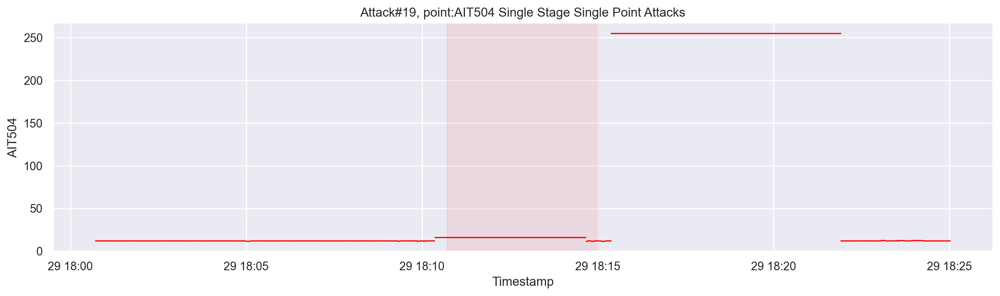

['AIT-504']
1 1
Start State: Value of AIT-504 <15 uS/cm 
Attack: Set value of AIT-504 to 255 uS/cm 
Expected Impact: RO shut down sequence starts after 30 minutes. Water should go to drain.
Unexpected Outcome: RO did not shutdown; Water did not go to drain


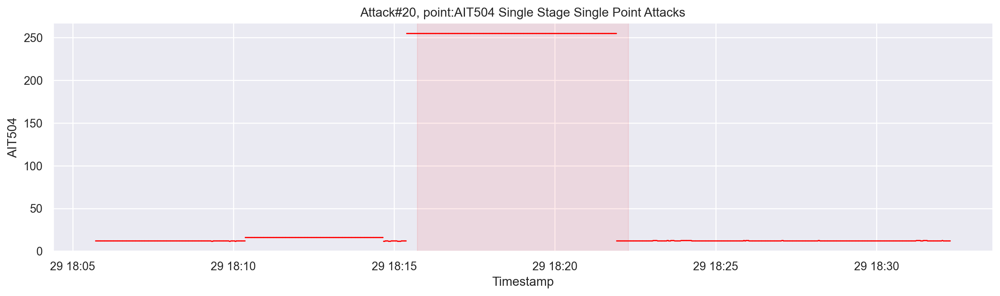

['MV-101', 'LIT-101']
1 2
Start State: MV-101 is open; LIT-101 between L and H 
Attack: Keep MV-101 on countinuosly; Value of LIT-101 set as 700 mm 
Expected Impact: Tank overflow


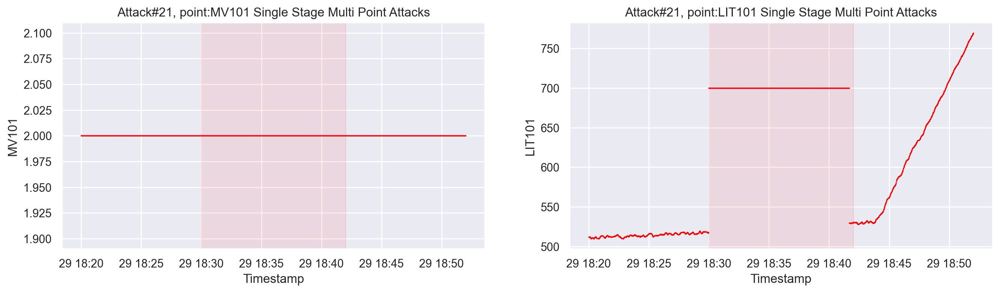

['UV-401', 'AIT-502', 'P-501', 'FIT-502']
2 2
Start State: UV-01 is on; AIT-502 is <150; P-501 is open 
Attack: Stop UV-401; Value of AIT502 set as 150; Force P-501 to remain on 
Expected Impact: Possible damage to RO
Unexpected Outcome: P501 could not be kept on; Reduced output at FIT-502


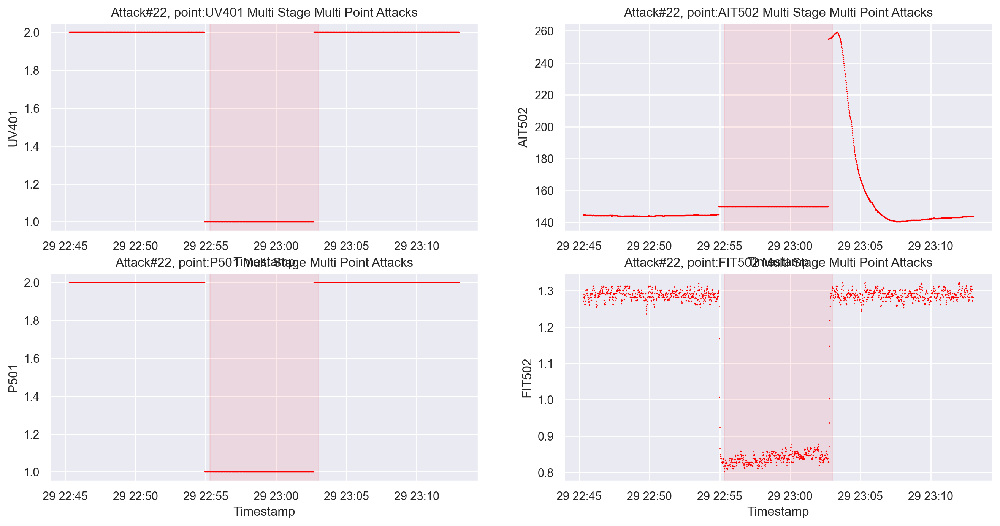

['P-602', 'DPIT-301', 'MV-302']
2 2
Start State: DPIT-301 is <0.4 bar; MV-302 is on; P-602 is closed 
Attack: Value of DPIT-301 set to >0.4 bar; Keep MV-302 open; Keep P-602 closed  
Expected Impact: System freeze


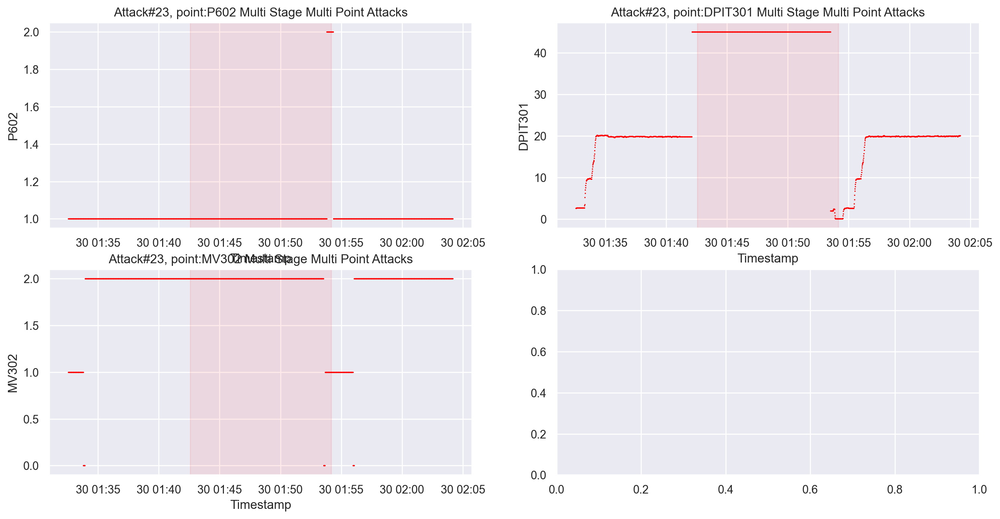

['P-203', 'P-205', 'P-101', 'LIT-101']
2 2
Start State: P-203 is on; P-205 is on 
Attack: Turn of P-203 and P-205 
Expected Impact: Change in water quality
Unexpected Outcome: Not much impact made due to closure of P-101 because tank T-101 became full


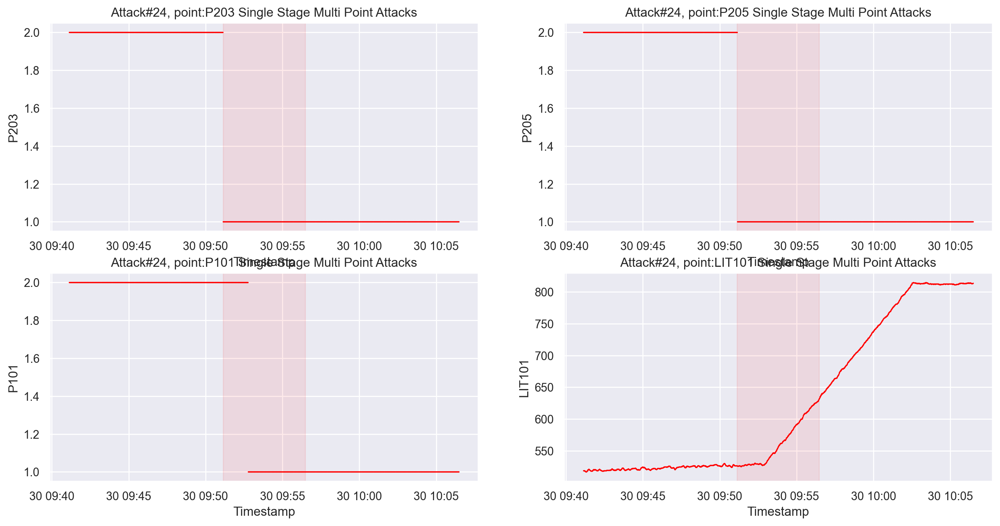

['LIT-401', 'P-402']
1 2
Start State: Value of LIT-401 <1000; P-402 is on 
Attack: Set value of LIT-401 as 1000; P-402 is kept on 
Expected Impact: Tank underflow


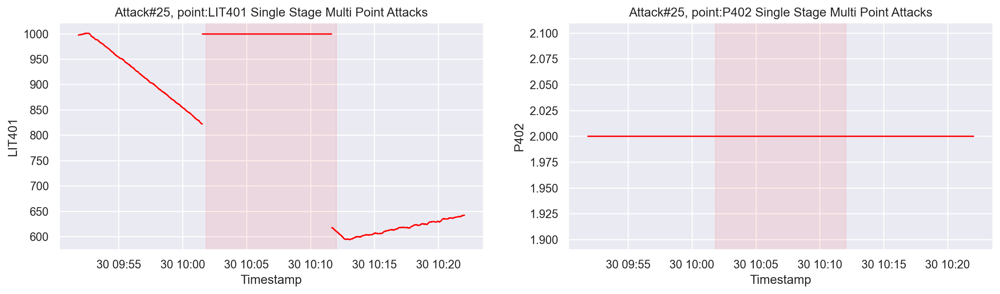

['P-101', 'LIT-101', 'P-102', 'LIT-301']
2 2
Start State: P-101 is off; P-102 is on; LIT-301 is between L and H 
Attack: P-101 is turned on continously; Set value of LIT-301 as 801 mm 
Expected Impact: Tank 101 underflow; Tank 301 overflow


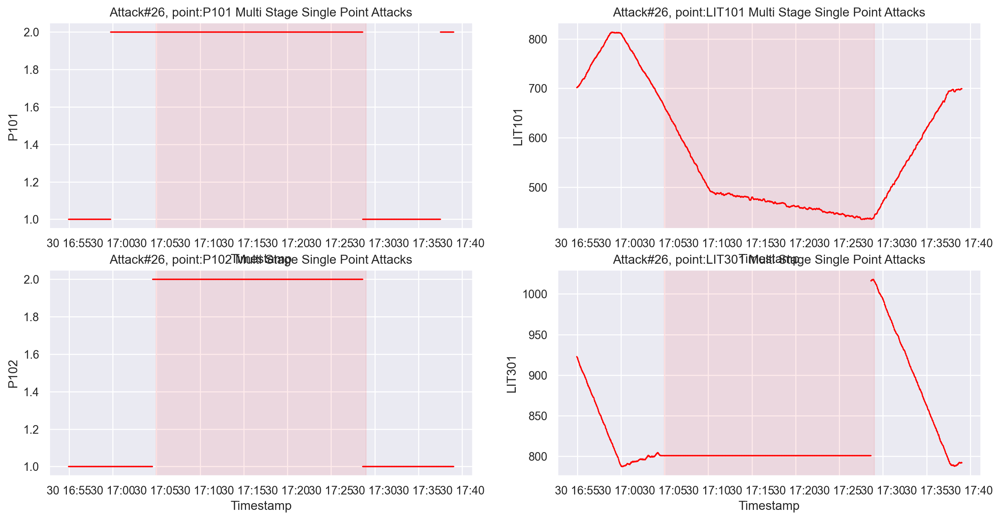

['P-302', 'LIT-401']
1 2
Start State: P302 is on, LIT401 Is  between L and H 
Attack: Keep P-302 on contineoulsy; Value of  LIT401 set as 600 mm till 1:26:01 
Expected Impact: Tank overflow


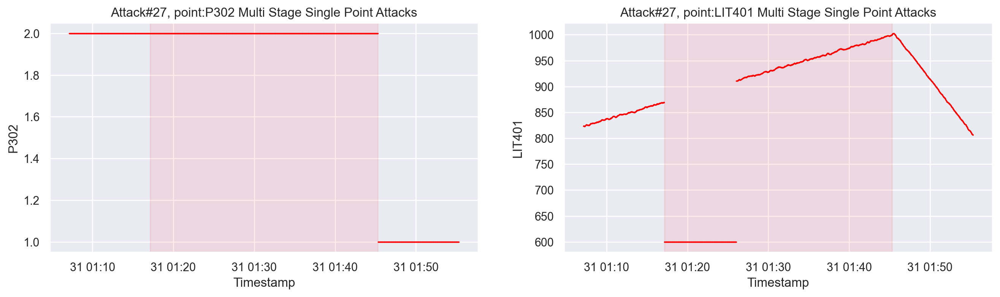

['P-302', 'FIT-401', 'LIT-401']
2 2
Start State: P302 is on 
Attack: Close P-302 
Expected Impact: Stop inflow of tank T-401


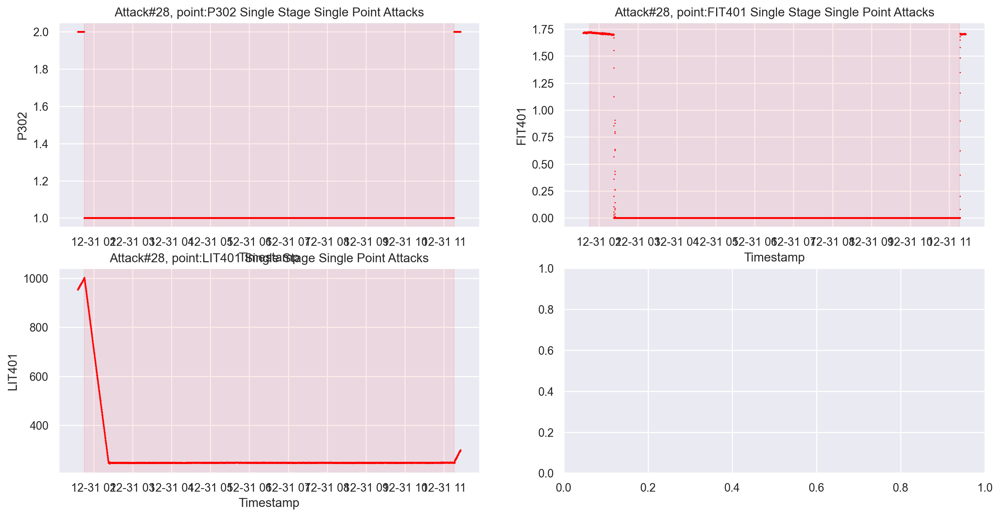

['P-201', 'P-203', 'P-205']
2 2
Start State: P-201 is closed; P-203 is closed; P-205 is closed 
Attack: Turn on P-201; Turn on P-203; Turn on P-205 
Expected Impact: Wastage of chemicals
Unexpected Outcome: The three dosing pump did not start because of some mechanical interlock


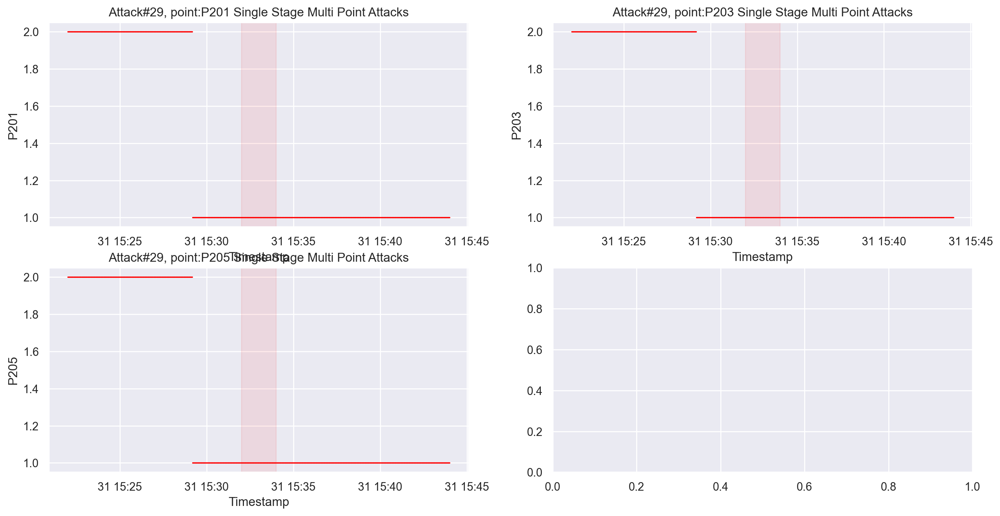

['LIT-101', 'P-101', 'MV-201', 'P-102', 'LIT-301']
3 3
Start State: P-101 is off; MV-101 is off; MV-201 is off; LIT-101 is between L and H;  LIT-301 is between L and H 
Attack: Turn P-101 on continuously; Turn MV-101 on continuously; Set value of LIT-101 as 700 mm; P-102 started itself because LIT301 level became low 
Expected Impact: Tank 101 underflow; Tank 301 overflow


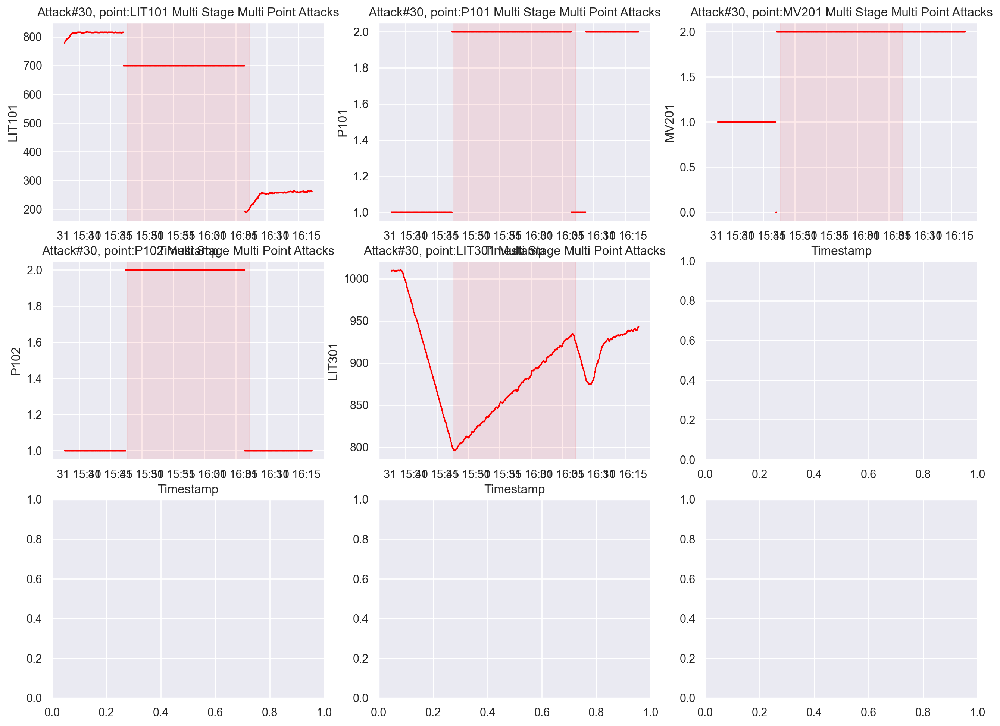

['LIT-401']
1 1
Start State: Water level between L and H 
Attack: Set LIT-401 to less than L 
Expected Impact: Tank overflow


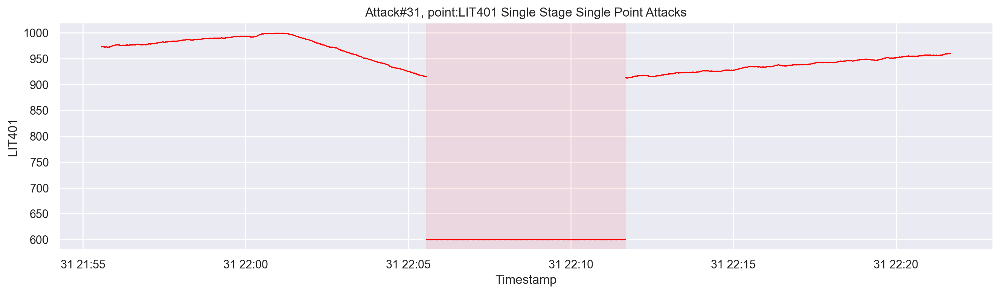

['LIT-301', 'P-302']
1 2
Start State: Water level between L and H 
Attack: Set LIT-301 to above HH 
Expected Impact: Tank underflow; Damage P-302


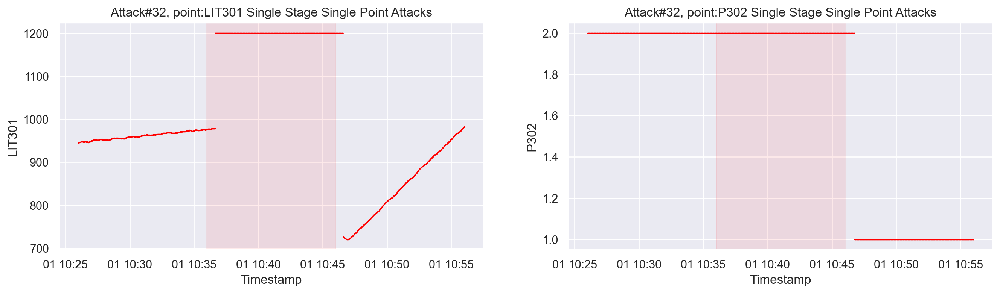

['LIT-101', 'P-101']
1 2
Start State: Water level between L and H 
Attack: Set LIT-101 to above H 
Expected Impact: Tank underflow; Damage P-101


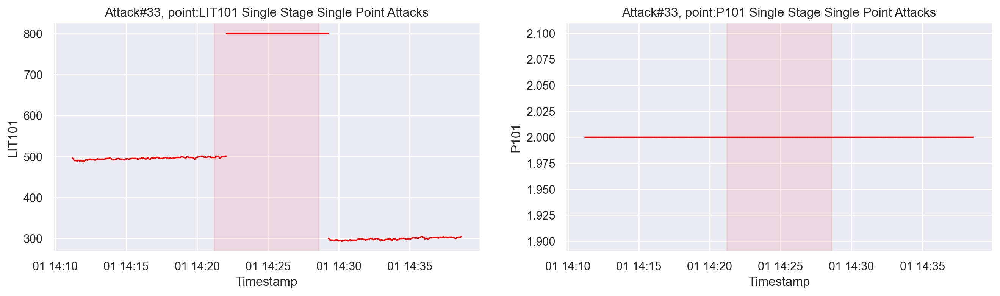

['P-101', 'P-102', 'FIT-101']
2 2
Start State: P-101 is on 
Attack: Turn P-101 off 
Expected Impact: Stops outflow
Unexpected Outcome: Outflow did not stop because the system turned on P-102


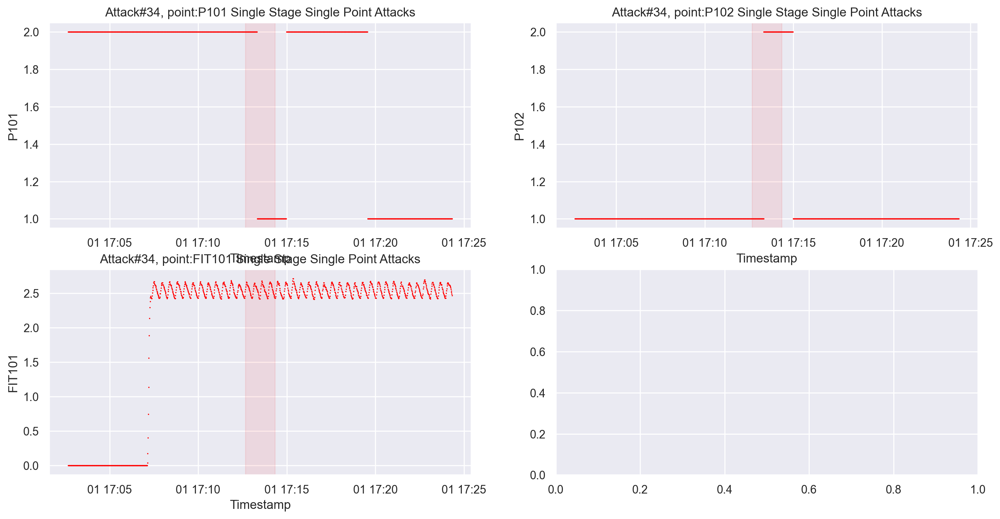

['P-101', 'P-102', 'FIT-101']
2 2
Start State: P-101 is on; P-102 is off 
Attack: Turn P-101 off; Keep P-102 off 
Expected Impact: Stops outflow


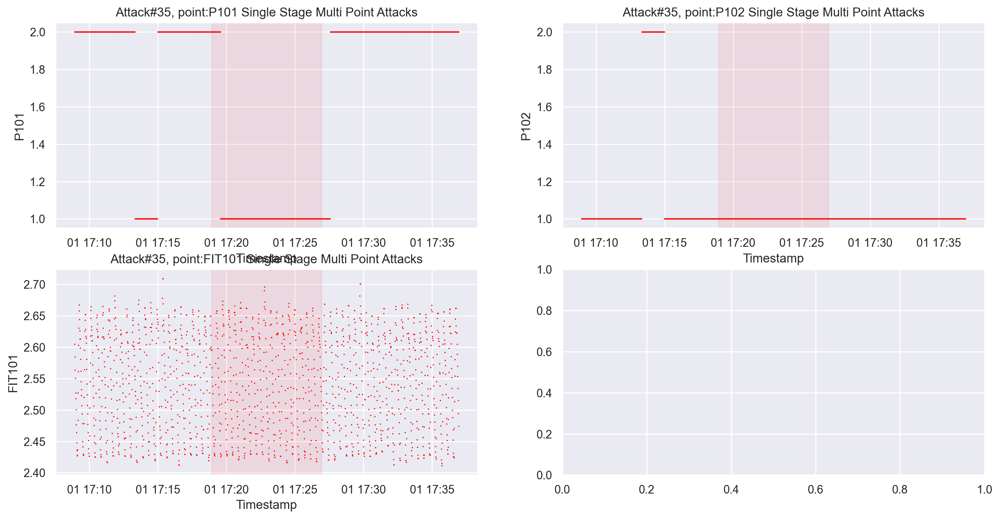

['LIT-101', 'FIT-101', 'P-101']
2 2
Start State: Water level between L and H 
Attack: Set LIT-101 to less than L 
Expected Impact: Tank overflow


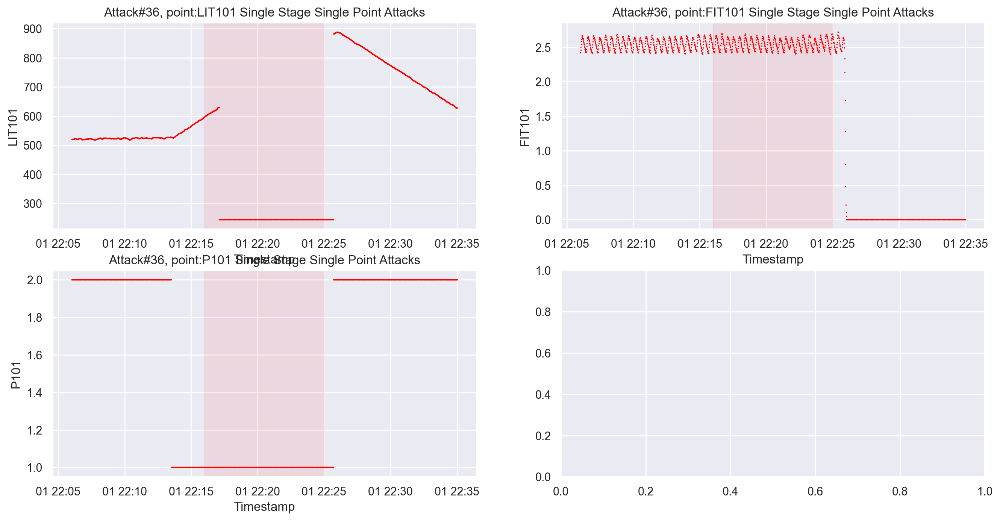

['P-501', 'FIT-502']
1 2
Start State: P-501 is on; FIT-502 in normal range 
Attack: Close P-501; Set value of FIT-502 to 1.29  at 11:18:36 
Expected Impact: Reduced output
Unexpected Outcome: P-501 did not turn off; FIT-502 decreased to 0.8; Speed of P-501 increased to 28.50 Hz from 10 Hz during attack.


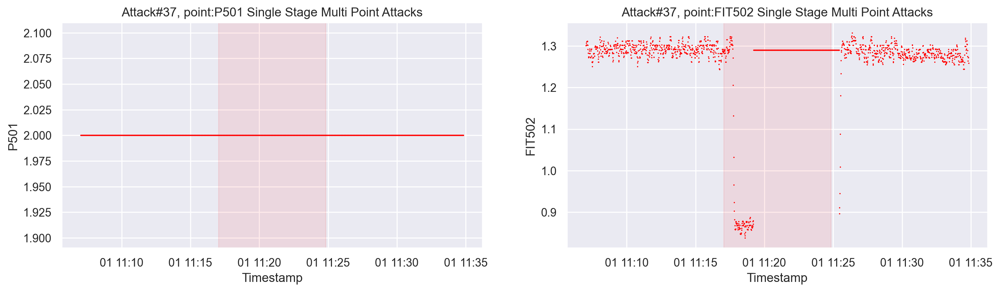

['AIT-402', 'AIT-502']
1 2
Start State: In Normal Range 
Attack: Set value of AIT402 as 260; Set value of AIT502 to 260 
Expected Impact: Water goes to drain because of overdosing
Unexpected Outcome: Water did not go to the drain


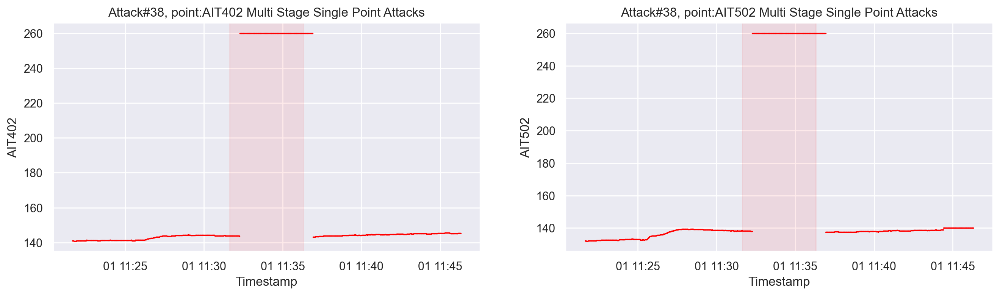

['FIT-401', 'AIT-502']
1 2
Start State: In Normal Range 
Attack: Set value of FIT-401 as 0.5; Set value of AIT-502 as 140 mV 
Expected Impact: UV will shut down and water will go to RO
Unexpected Outcome: UV did not shutdown


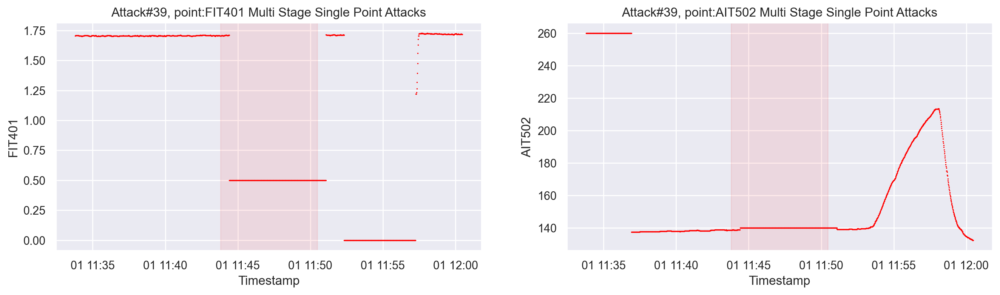

['FIT-401']
1 1
Start State: In Normal Range 
Attack: Set value of FIT-401 as 0 
Expected Impact: UV will shut down and water will go to RO
Unexpected Outcome: P-402 did not close, both should be interlinked


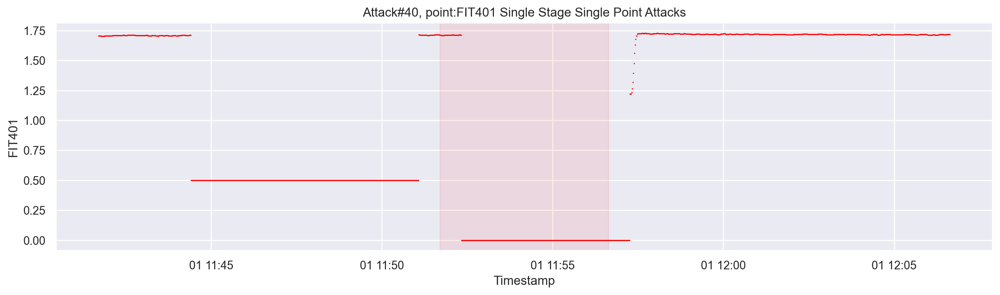

['LIT-301']
1 1
Start State: Water level between L and H 
Attack: decrease value by 0.5 mm per second 
Expected Impact: Tank overflow
Unexpected Outcome: Rate of decrease in water level reduced after 1:33:25 PM


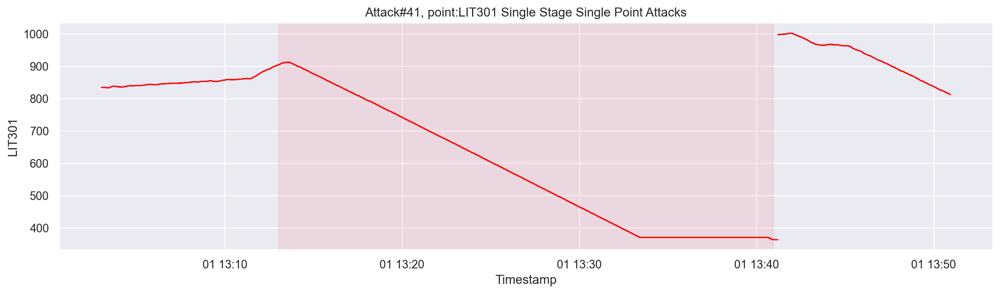

In [304]:

for i in range(len(attacks_list_df)):
    attack_n = attacks_list_df['Attack#'][i]
    start_state = attacks_list_df['Start State'][i]
    attack = attacks_list_df['Attack'][i]
    expected_impact = attacks_list_df['Expected Impact or attacker intent'][i]
    unexpected_outcome = attacks_list_df['Unexpected Outcome'][i]

    attack_points = attacks_list_df['Attack Point'][i].split(', ')
    print(attack_points)
    attack_type = attacks_list_df['Attack Type'][i]

    start = pd.to_datetime(attacks_list_df['Start Time'][i])
    end = pd.to_datetime(attacks_list_df['End Time'][i])
    start_time = start - pd.Timedelta(minutes=10)
    end_time = end + pd.Timedelta(minutes=10)
    s = df['Timestamp'].between(start_time, end_time)

    n_rows = 1 if int(len(attack_points)) < 2 else 2
    n_cols = int((len(attack_points)+1) / 3)+1
    print(n_rows, n_cols)
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(16,4*n_rows), dpi=200)

    print("Start State:", start_state, "\nAttack:", attack, "\nExpected Impact:", expected_impact)
    if str(unexpected_outcome) != "nan":
        print("Unexpected Outcome:", unexpected_outcome)

    for i, attack_point in enumerate(attack_points):
        attack_point = attack_point.replace('-', '')
        if attack_point in df.columns:
            plt.subplot(n_rows, n_cols, i+1)
            g = sns.scatterplot(data=df.loc[s], x='Timestamp', y=attack_point, color='red', edgecolor=None, linewidth=.5, s=.5)
            g.set_title(f"Attack#{attack_n}, point:{attack_point} {attack_type}")
            
            plt.axvspan(start, end,  color='red',   alpha=0.08)
            
        
        else:
            print(attack_point, "not found in dataset")
    plt.show()


In [174]:
attacks_df

,Attack#,Start Time,End Time,Attack Point,Start State,Attack,Actual Change,Expected Impact or attacker intent,Unexpected Outcome,type of attack
0,1,2015-12-28 10:29:14,2015-12-28 10:44:53,MV101,MV101 is closed,Open MV101,Yes,Tank overflow,NaN,Single Stage Single Point Attacks
1,2,2015-12-28 10:51:08,2015-12-28 10:58:30,P102,P101 is on where as P102 is off,Turn on P102,Yes,Pipe bursts,NaN,Single Stage Single Point Attacks
2,3,2015-12-28 11:22:00,2015-12-28 11:28:22,LIT101,Water level between L and H,Increase by 1 mm every second,No,Tank Underflow; Damage P101,NaN,Single Stage Single Point Attacks
3,4,2015-12-28 11:47:39,2015-12-28 11:54:08,MV504,MV504 is closed,Open MV504,Yes,Halt RO shut down sequence; Reduce life of RO,No impact,Single Stage Single Point Attacks
4,5,2015-12-28 11:58:20,2015-12-28 11:58:20,No Physical Impact Attack,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2015-12-28 12:00:55,2015-12-28 12:04:10,AIT202,Value of AIT202 is >7.05,Set value of AIT202 as 6,No,P203 turns off; Change in water quality,Impact seen on AIT504 after two hours at aroun...,Single Stage Single Point Attacks
6,7,2015-12-28 12:08:25,2015-12-28 12:15:33,LIT301,Water level between L and H,Water level increased above HH,No,Stop of inflow; Tank underflow; Damage P301,NaN,Single Stage Single Point Attacks
7,8,2015-12-28 13:10:10,2015-12-28 13:26:13,DPIT301,Value of DPIT is <40kpa,Set value of DPIT as >40kpa,No,Backwash process is started again and again; N...,NaN,Single Stage Single Point Attacks
8,10,2015-12-28 14:16:20,2015-12-28 14:19:00,FIT401,Value of FIT401 above 1,Set value of FIT401 as <0.7,No,UV shutdown; P501 turns off,UV did not shutdown; P501 did not turn off,Single Stage Single Point Attacks
9,11,2015-12-28 14:19:00,2015-12-28 14:28:20,FIT401,Value of FIT401 above 1,Set value of FIT401 as 0,No,UV shutdown; P501 turns off;,NaN,Single Stage Single Point Attacks


In [173]:
attacks_df['Start Time'] = pd.to_datetime(attacks_df['Start Time'])
attacks_df['End Time'] = pd.to_datetime(attacks_df['End Time'])

In [ ]:

# data_correlation = df.corr()

# plt.figure(figsize=(20,20))
# sns.heatmap(data_correlation, annot=True, cmap=plt.cm.Reds)
# plt.show()


<AxesSubplot:xlabel='MV101', ylabel='Count'>

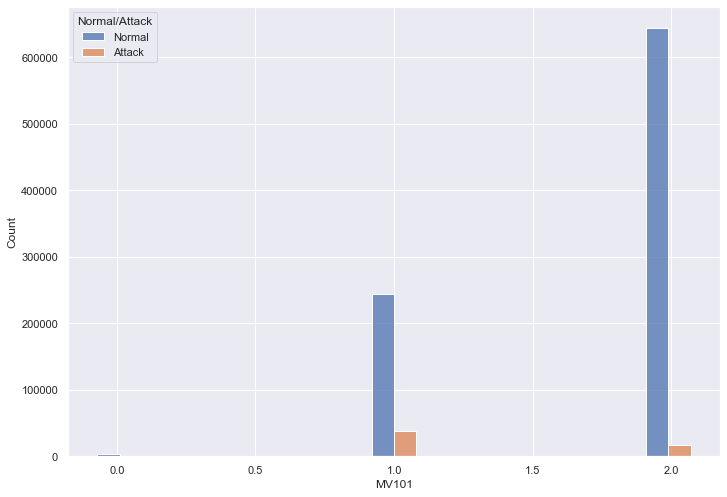

In [47]:
sns.histplot(data=df, x='MV101', hue='Normal/Attack', multiple="dodge", shrink=8)

In [144]:

# data = pd.DataFrame()
data=pd.melt(min_max_normalized_df[cols_numeric[0:10]])


## Boxplot

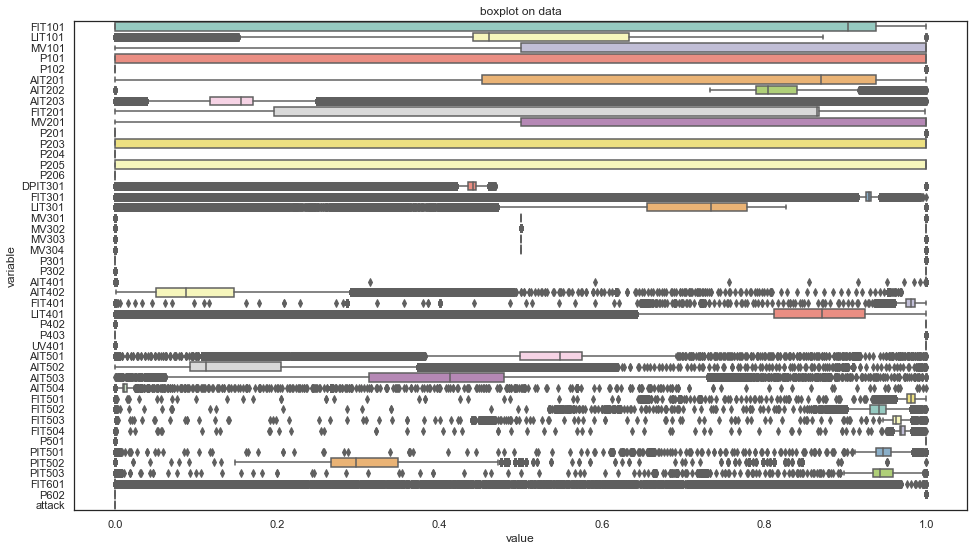

0.0    892098
Name: attack, dtype: int64

In [155]:
data = min_max_normalized_df[cols_numeric]
data_sns = data[data['attack'] == 0]
f, ax = plt.subplots(figsize = (16,9))
ax = sns.boxplot(x="value", y="variable", data=pd.melt(data_sns), palette="Set3")
ax.set_title(f'boxplot on data')
plt.show()
data_sns['attack'].value_counts()

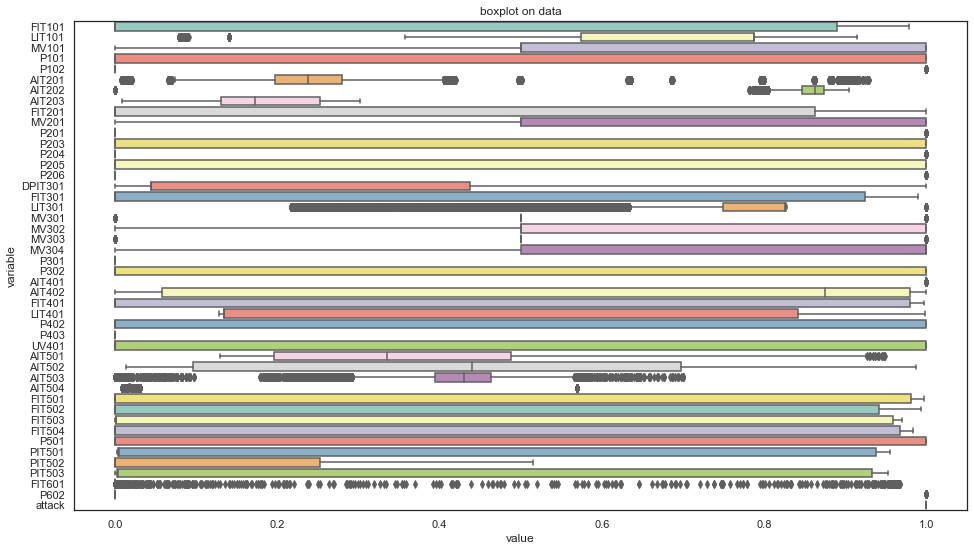

1.0    54621
Name: attack, dtype: int64

In [156]:
data = min_max_normalized_df[cols_numeric]
data_sns = data[data['attack'] == 1]
f, ax = plt.subplots(figsize = (16,9))
ax = sns.boxplot(x="value", y="variable", data=pd.melt(data_sns), palette="Set3")
ax.set_title(f'boxplot on data')
plt.show()
data_sns['attack'].value_counts()

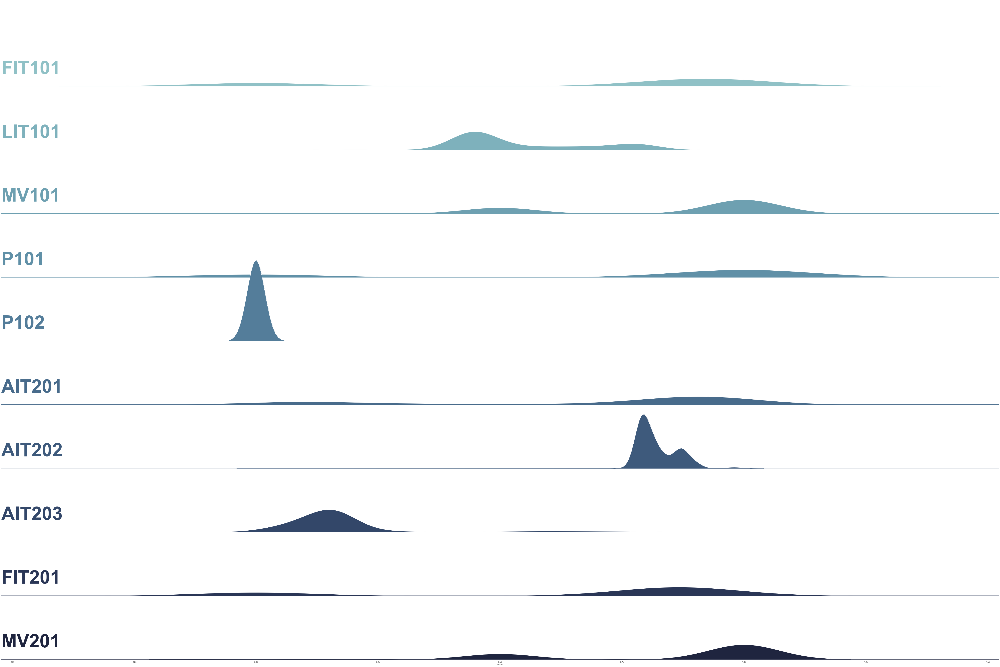

In [153]:
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})


data = pd.melt(min_max_normalized_df[cols_numeric[0:10]])

# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(data, row="variable", hue="variable", aspect=15, height=5, palette=pal)

# Draw the densities in a few steps
g.map(sns.kdeplot, "value", bw_adjust=5, clip_on=False, fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, "value", clip_on=False, color="w", lw=2, bw_adjust=5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)


# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color=color, ha="left", va="center", transform=ax.transAxes, fontsize=100)


g.map(label, "value")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)

## Plot

/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_36347/261535131.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f'plot/{feature}_plot.png')
/Users/david/miniconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:1727: UserWarning: Attempting to set identical bottom == top == 1 results in singular transformations; automatically expanding.
  ax_joint.set_ylim(ylim)
/var/folders/cc/whpcb33912lfp0b714xmf83m0000gn/T/ipykernel_36347/261535131.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f'plot/{feature}_plot.png')
/Users/david/miniconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:1670: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.f

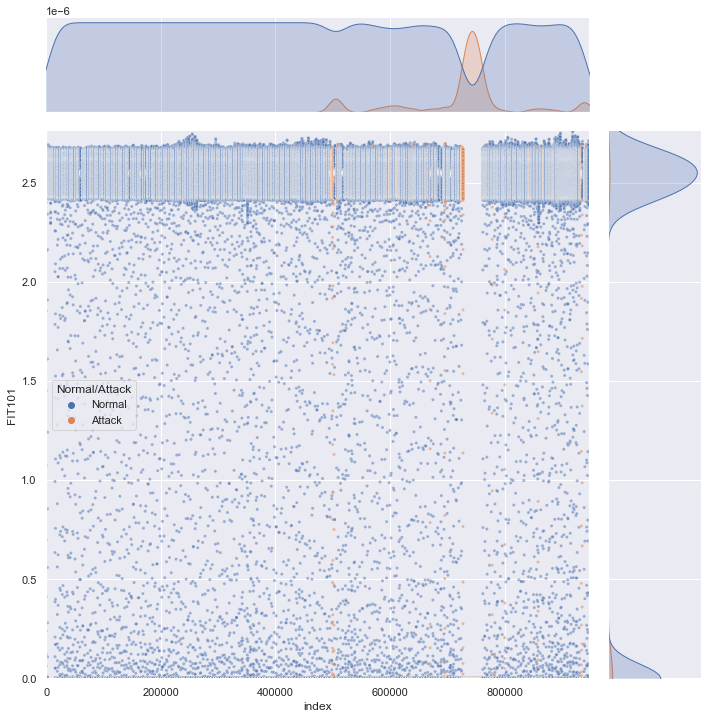

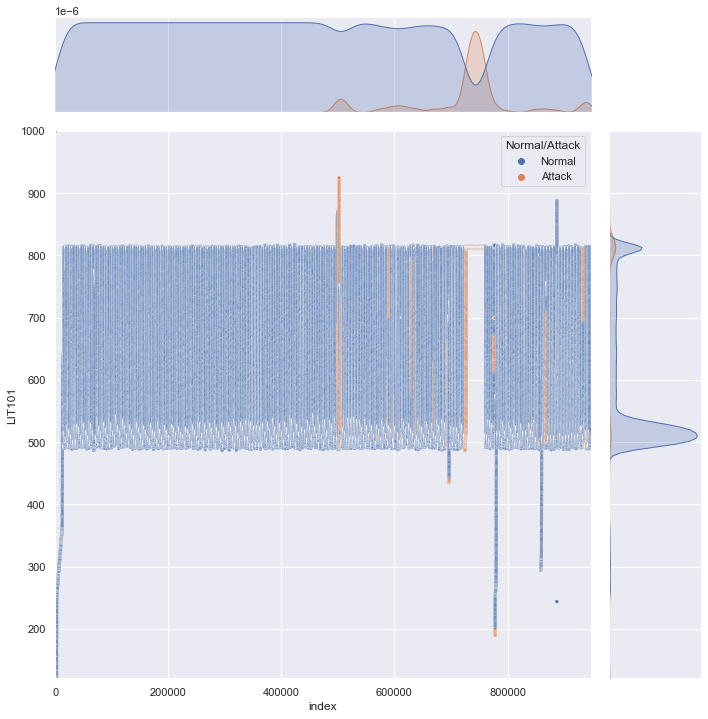

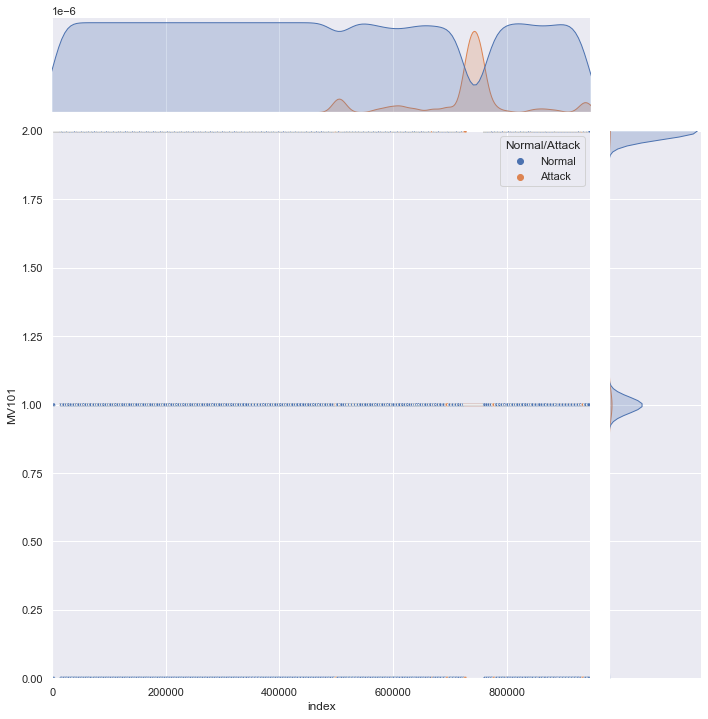

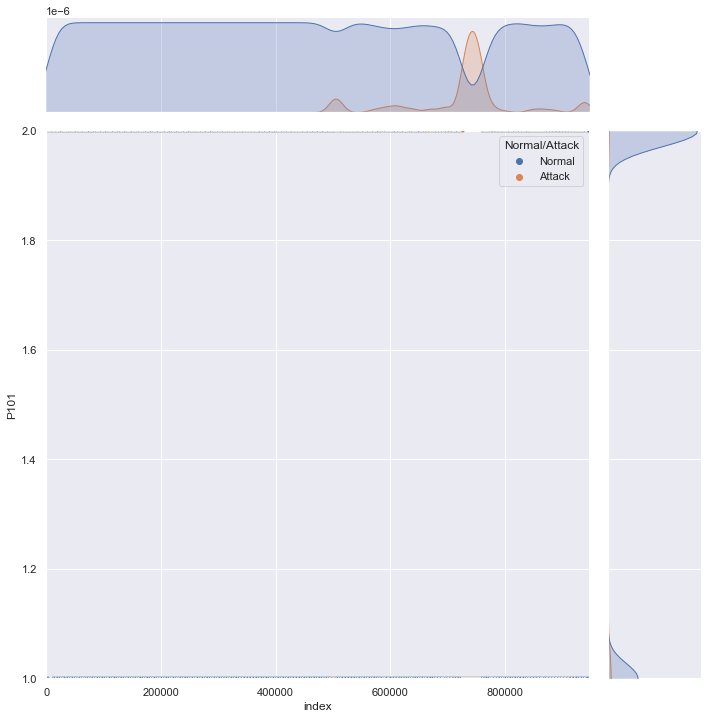

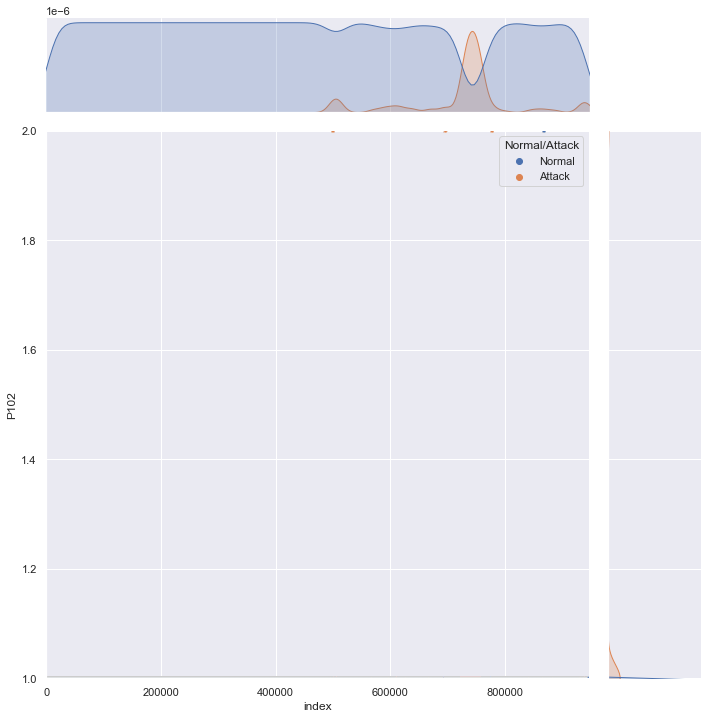

...

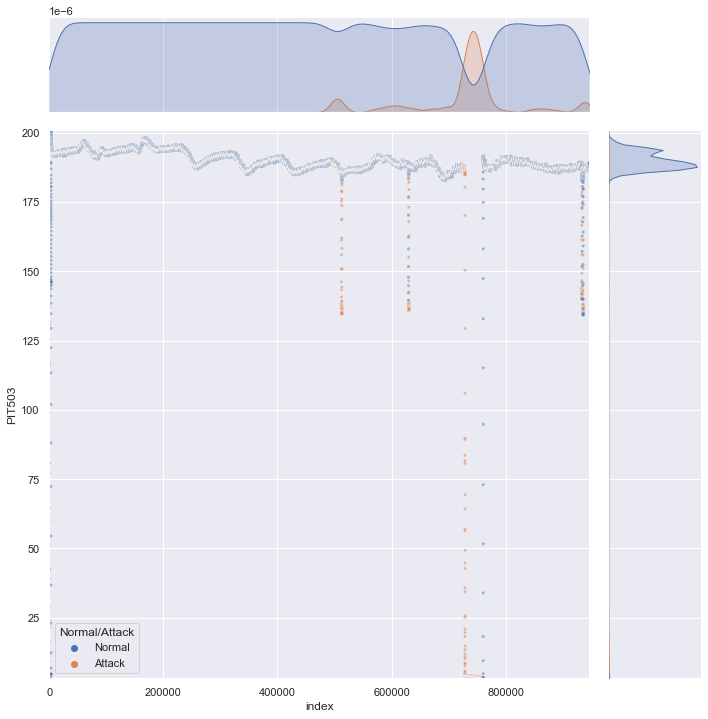

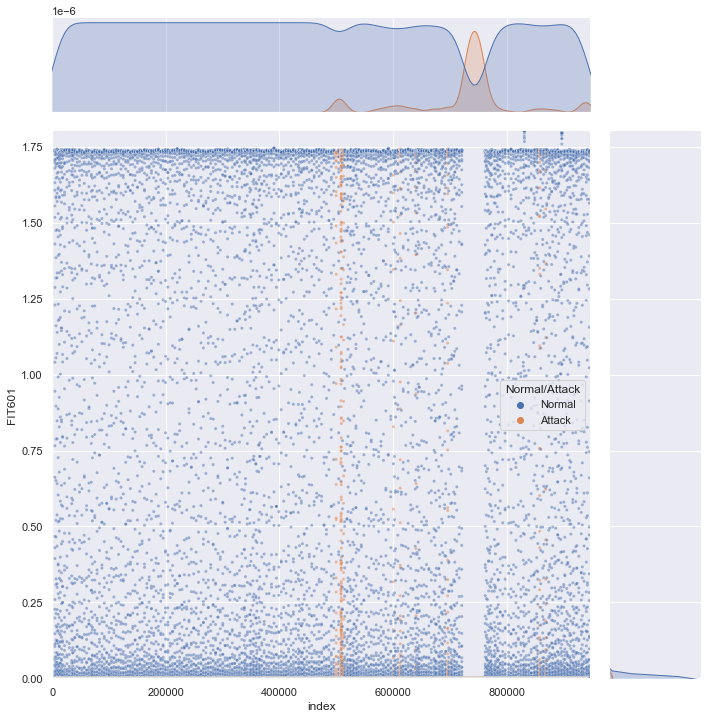

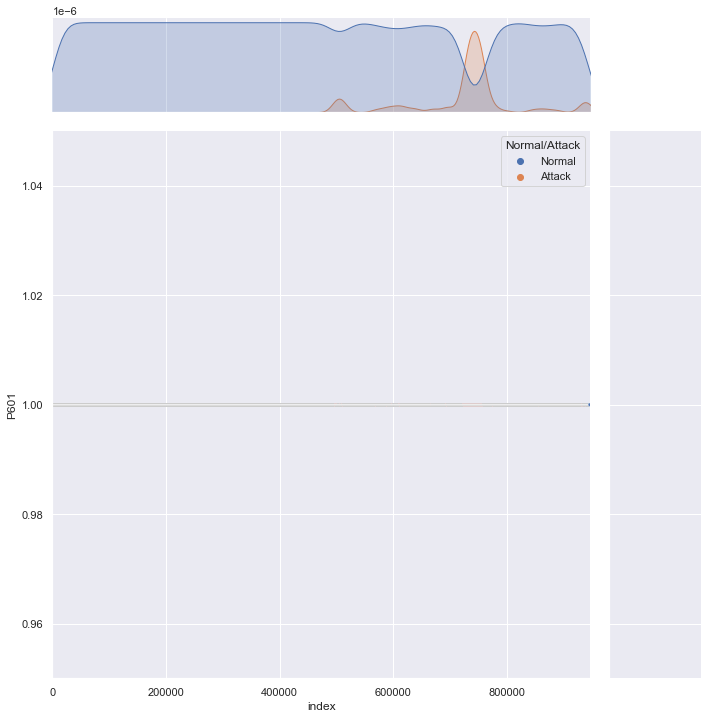

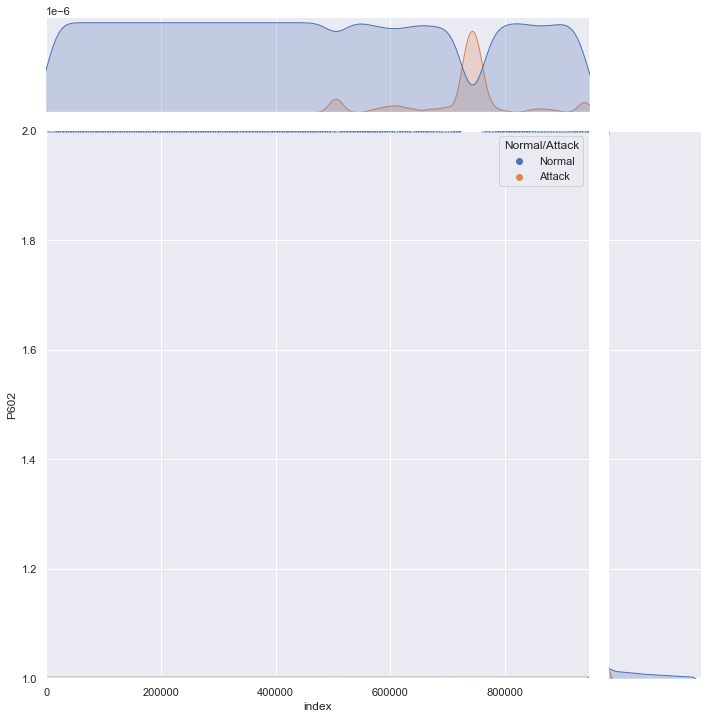

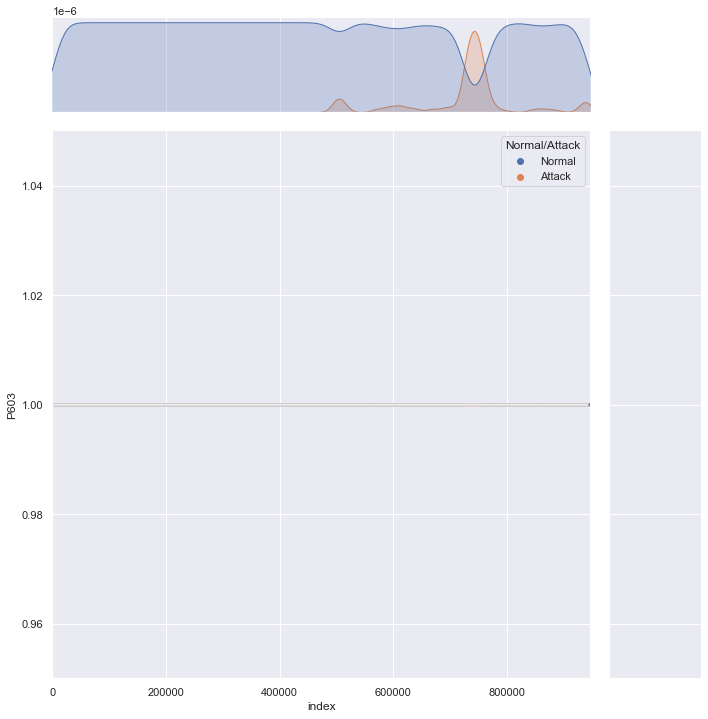

In [13]:
cols = list(df.columns)
cols.remove(' Timestamp')
cols.remove('Normal/Attack')
cols.remove('index')
for feature in cols:
    min_ = df[feature].min()
    max_ = df[feature].max()
    sns.jointplot(data=df,x='index', y=feature, hue='Normal/Attack', xlim=(0, len(df)), ylim=(min_, max_), alpha=0.5, marker="o", s=10, height=10)
    plt.savefig(f'plot/{feature}_plot.png')